<h1 style="text-align:center; font-size:34px"> New York Ecommerce Customers | Linear Regression </h1>

# About the Dataset
The dataset has the details of customers of a New York based Ecommerce company that sells clothing online but they also have in-store style and clothing advice sessions. Customers come in to the store, have sessions/meetings with a personal stylist, then they can go home and order either on a mobile app or website for the clothes they want.

The company is trying to decide whether to focus their efforts on their mobile app experience or their website. Therefore, now it is our job to analyze the data and let them figure it out!

**Dataset is only for testing skills, there is no such resemblance with real world entities.**

### Dataset Features:
Dataset has customer info, suchas Email, Address, and their color Avatar. Then it also has numerical value columns:
- Avg. Session Length: Average session of in-store style advice sessions.
- Time on App: Average time spent on App in minutes
- Time on Website: Average time spent on Website in minutes
- Length of Membership: How many years the customer has been a member. 

# Importing Libraries & Setting Notebook Defaults

In [1]:
# Data Analyzing Libraries:
import numpy as np
import pandas as pd

In [2]:
# Data Visualization Libraries:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
# Setting DPI for Figure Level Plots
plt.rcParams["figure.dpi"] = 720

In [4]:
sns.set_style('whitegrid')

# Reading the Dataset

In [5]:
customers = pd.read_csv("Ecommerce Customers")
customers.head()

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",Violet,34.497268,12.655651,39.577668,4.082621,587.951054
1,hduke@hotmail.com,"4547 Archer Common\nDiazchester, CA 06566-8576",DarkGreen,31.926272,11.109461,37.268959,2.664034,392.204933
2,pallen@yahoo.com,"24645 Valerie Unions Suite 582\nCobbborough, D...",Bisque,33.000915,11.330278,37.110597,4.104543,487.547505
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
4,mstephens@davidson-herman.com,"14023 Rodriguez Passage\nPort Jacobville, PR 3...",MediumAquaMarine,33.330673,12.795189,37.536653,4.446308,599.406092


In [6]:
customers.describe()

,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
count,500.000000,500.000000,500.000000,500.000000,500.000000
mean,33.053194,12.052488,37.060445,3.533462,499.314038
std,0.992563,0.994216,1.010489,0.999278,79.314782
min,29.532429,8.508152,33.913847,0.269901,256.670582
25%,32.341822,11.388153,36.349257,2.930450,445.038277
50%,33.082008,11.983231,37.069367,3.533975,498.887875
75%,33.711985,12.753850,37.716432,4.126502,549.313828
max,36.139662,15.126994,40.005182,6.922689,765.518462


In [7]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Email                 500 non-null    object 
 1   Address               500 non-null    object 
 2   Avatar                500 non-null    object 
 3   Avg. Session Length   500 non-null    float64
 4   Time on App           500 non-null    float64
 5   Time on Website       500 non-null    float64
 6   Length of Membership  500 non-null    float64
 7   Yearly Amount Spent   500 non-null    float64
dtypes: float64(5), object(3)
memory usage: 31.4+ KB


# Exploratory Data Analysis

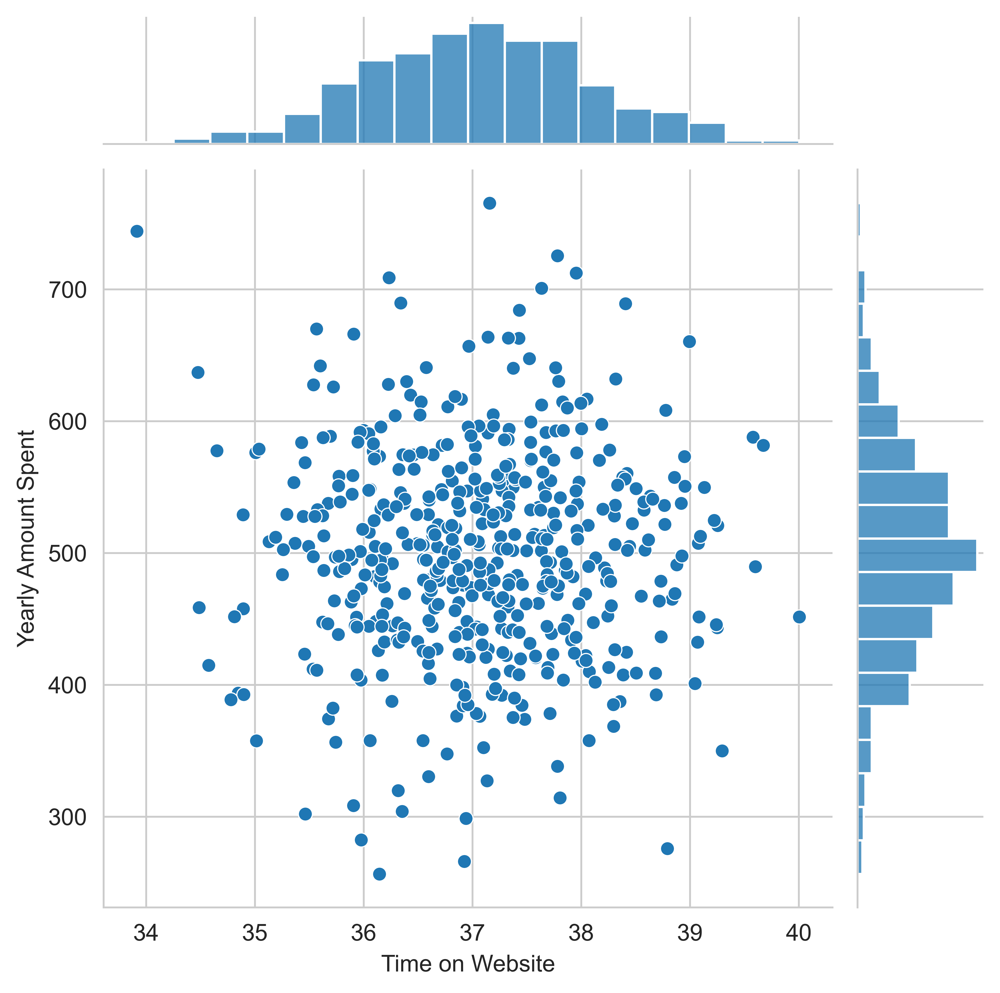

In [8]:
# Comparing 'Time on Website' and 'Yearly Amount Spent' Distributions
sns.jointplot(x='Time on Website',y='Yearly Amount Spent',data=customers)
plt.show()

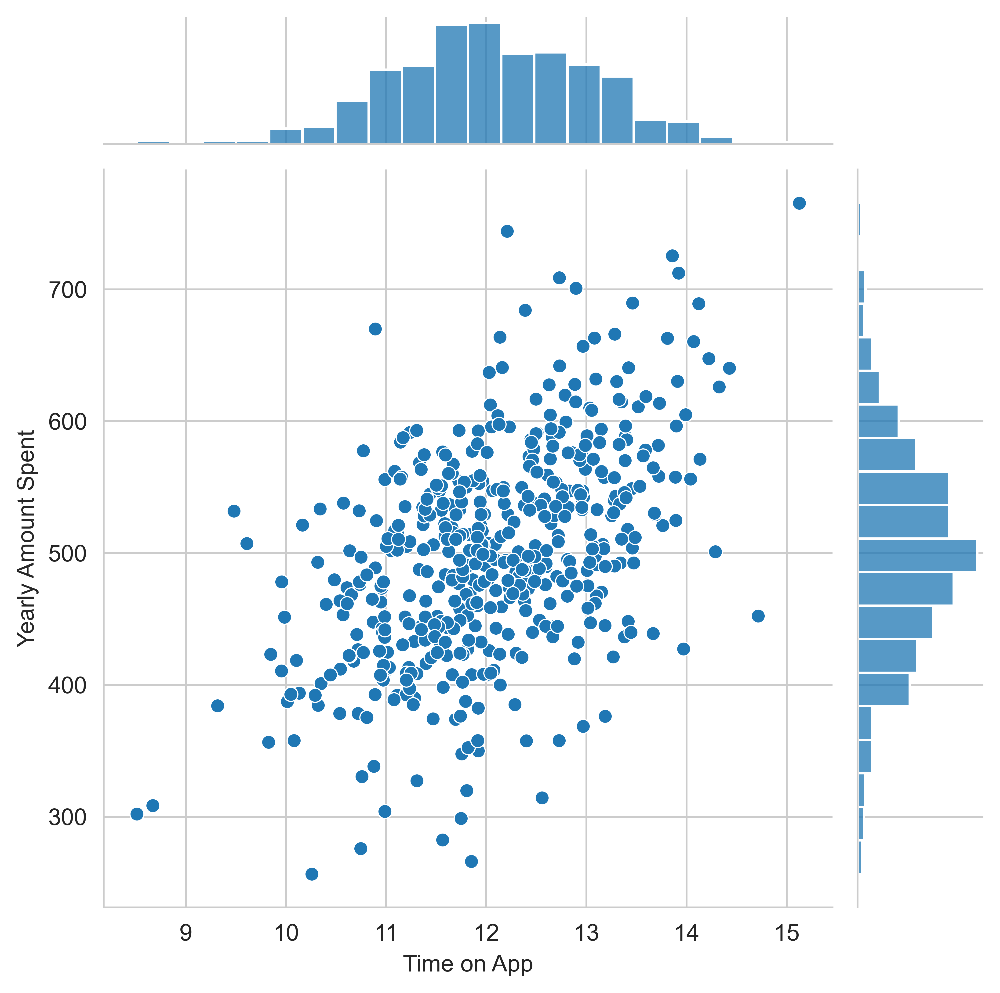

In [9]:
# Comparing 'Time on App' and 'Yearly Amount Spent' Distributions
sns.jointplot(x='Time on App',y='Yearly Amount Spent',data=customers)
plt.show()

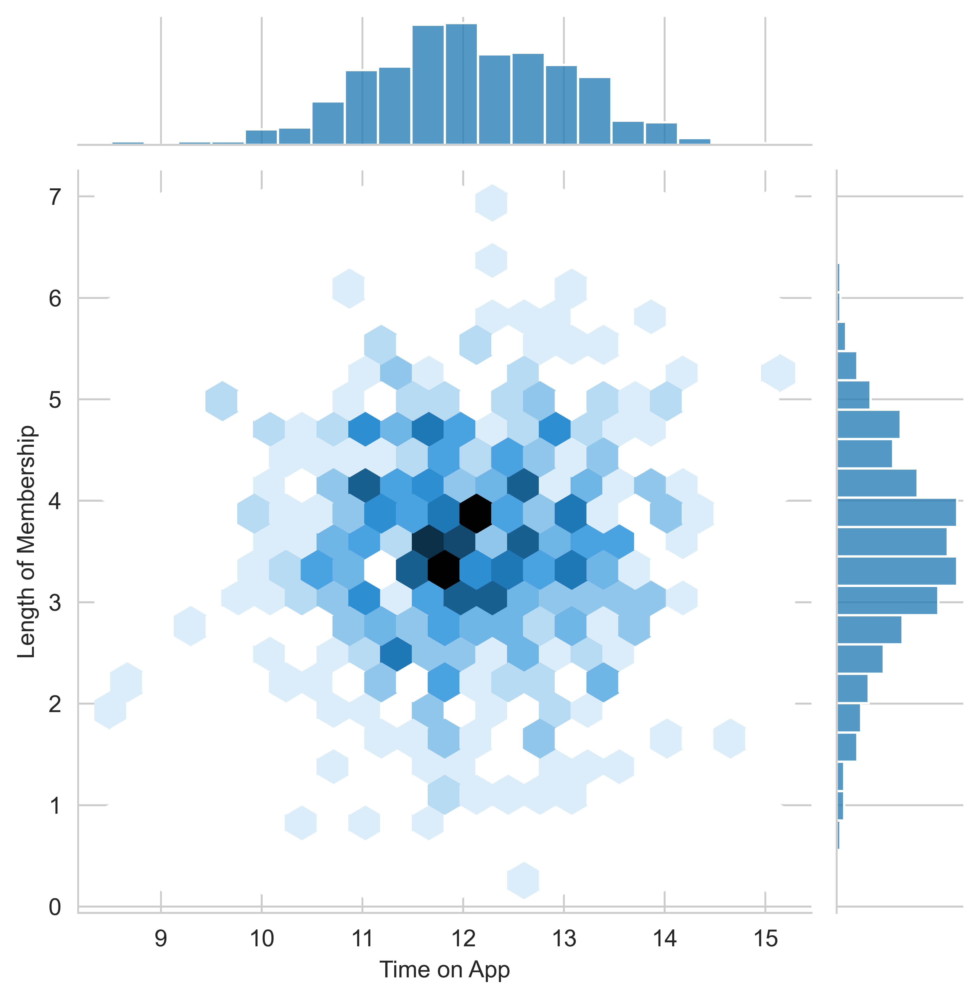

In [10]:
# Comparing 'Time on App' and 'Length of Membership'
sns.jointplot(x='Time on App',y='Length of Membership',kind='hex',data=customers)
plt.show()

In [11]:
sns.pairplot(customers)
plt.show()

**Observation:**
- 'Length of Membership' looks to be the most correlated feature with 'Yearly Amount Spent'.

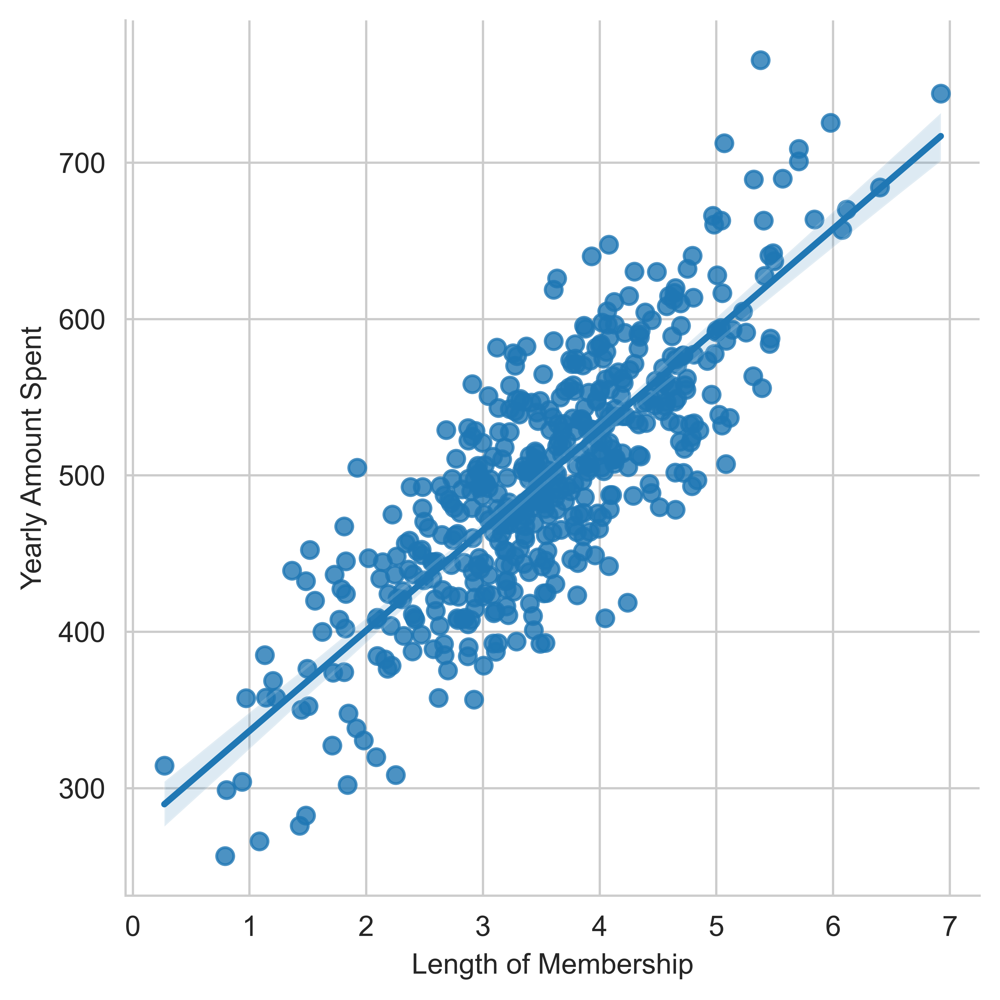

In [12]:
# Linear Model Plot of 'Yearly Amount Spent' vs 'Length of Membership'
sns.lmplot(x='Length of Membership',y='Yearly Amount Spent',data=customers)
plt.show()

# Machine Learning

In [13]:
y = customers['Yearly Amount Spent']
X = customers[['Avg. Session Length', 'Time on App','Time on Website', 'Length of Membership']]

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

## Training the Model

In [15]:
from sklearn.linear_model import LinearRegression
LR_model = LinearRegression()

In [16]:
LR_model.fit(X_train,y_train)

LinearRegression()

In [17]:
# Predicting Test Data
predictions = LR_model.predict(X_test)

# Evaluation

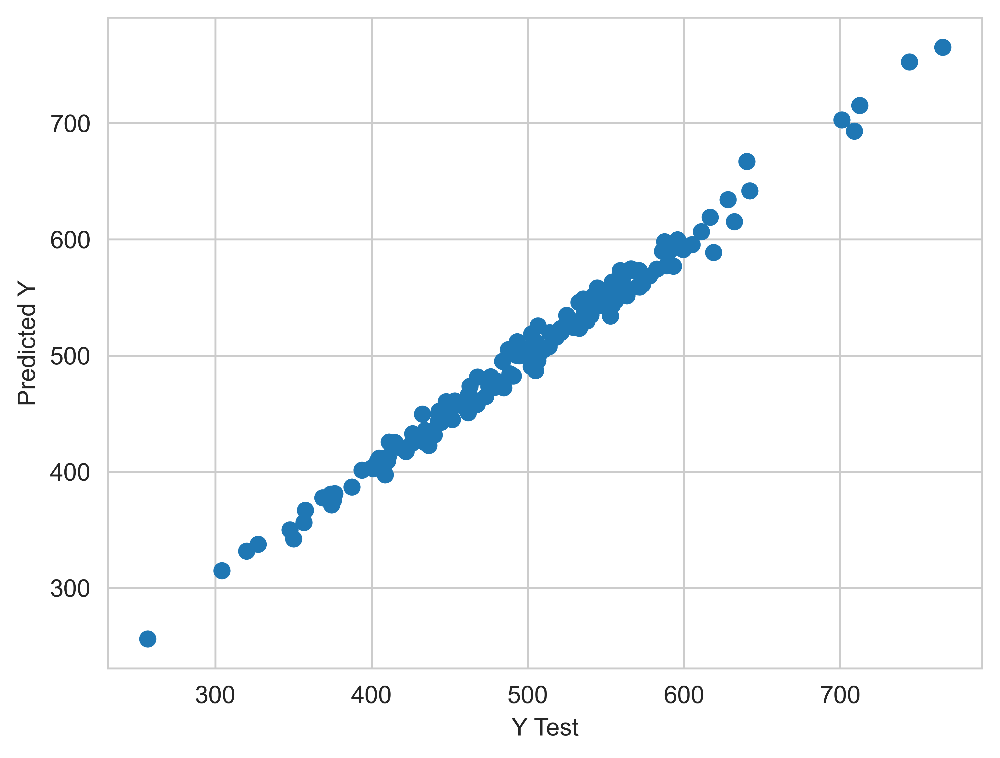

In [18]:
plt.scatter(y_test,predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

## Evaluating the Model

In [19]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 7.2281486534308295
MSE: 79.8130516509744
RMSE: 8.933815066978632


## Residuals

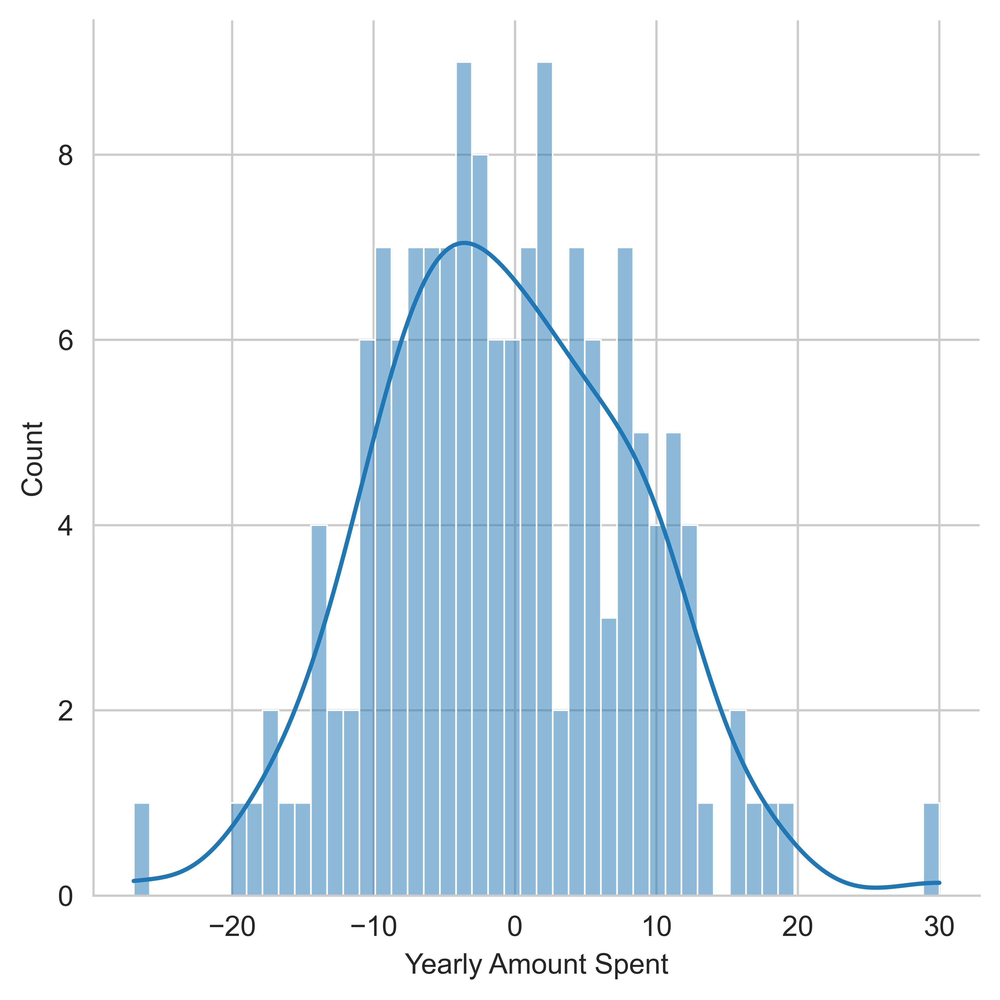

In [20]:
sns.displot((y_test-predictions),bins=50, kde=True);
plt.show()
# Histogram of the residuals is normally distributed, which is a good sign.

# Conclusion

In [21]:
coeffecients = pd.DataFrame(LR_model.coef_,X.columns)
coeffecients.columns = ['Coeffecient']
coeffecients

,Coeffecient
Avg. Session Length,25.981550
Time on App,38.590159
Time on Website,0.190405
Length of Membership,61.279097


Interpreting the coefficients:

- Holding all other features fixed, a 1 unit increase in **Avg. Session Length** is associated with an **increase of 25.98 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Time on App** is associated with an **increase of 38.59 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Time on Website** is associated with an **increase of 0.19 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Length of Membership** is associated with an **increase of 61.27 total dollars spent**.

**Suggestion:**
- It can be seen there is space for improvment over Website as 'Time on Website' is least being profitable and it will be good if a website makes a good impression to the person who only vists website for first time. Eventually, The customer's faith in company will increase with time as we are seeing most profitable cofficient is 'Length of Membership'.

---

<h2 style="text-align:center;"> Thanks for reading the Notebook! </h2>